In [128]:
import polars as pl 
import numpy as np
import pandas as pd
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns


from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score 


dataPath = "./home-credit-credit-risk-model-stability/"

In [80]:
#import X_train, y_train, base_train, X_test, y_test, base_test
X_train = pd.read_csv(dataPath + "X_train.csv")
y_train = pd.read_csv(dataPath + "y_train.csv")
base_train = pd.read_csv(dataPath + "base_train.csv")
X_test = pd.read_csv(dataPath + "X_test.csv")
y_test = pd.read_csv(dataPath + "y_test.csv")
base_test = pd.read_csv(dataPath + "base_test.csv")

In [81]:
print(f"Train: {base_train.shape}, Type: {type(base_train)}")
print(f"Test: {y_train.shape}, Type: {type(base_test)}")



Train: (1221327, 3), Type: <class 'pandas.core.frame.DataFrame'>
Test: (1221327, 1), Type: <class 'pandas.core.frame.DataFrame'>


In [82]:
print(y_train.head())

   target
0       0
1       0
2       0
3       0
4       0


In [83]:
print(base_train.head())

   case_id  WEEK_NUM  target
0        0         0       0
1        1         0       0
2        2         0       0
3        5         0       0
4        6         0       0


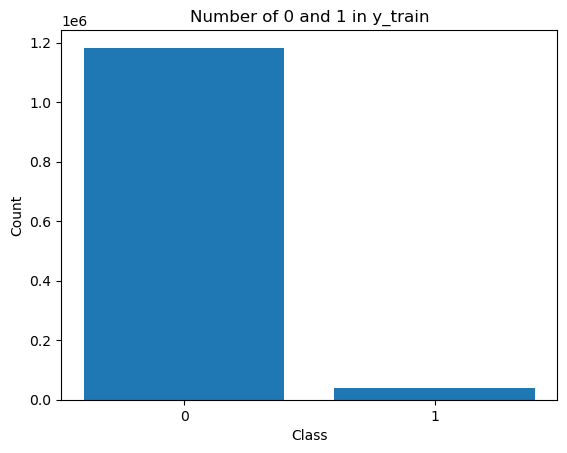

In [84]:
# Count the number of 0s and 1s
counts = y_train['target'].value_counts()

# Create a bar chart
plt.bar(counts.index, counts.values)

# Label the x-axis and y-axis
plt.xlabel('Class')
plt.ylabel('Count')

# Add a title
plt.title('Number of 0 and 1 in y_train')

# Specify the x-axis tick marks
plt.xticks([0, 1])

# Show the plot
plt.show()

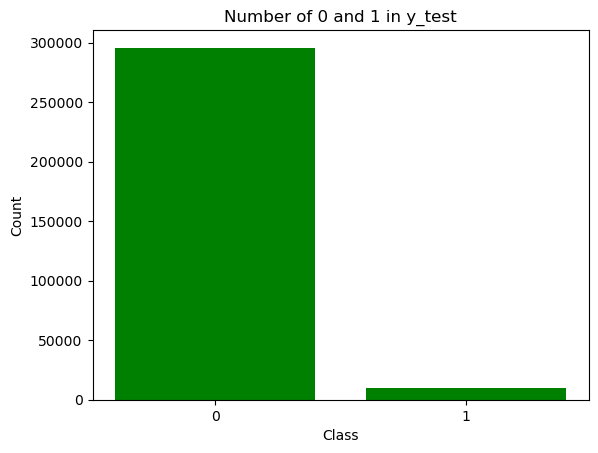

In [85]:
# Count the number of 0s and 1s
counts = y_test['target'].value_counts()

# Create a bar chart
plt.bar(counts.index, counts.values, color=[ 'green'])

# Label the x-axis and y-axis
plt.xlabel('Class')
plt.ylabel('Count')

# Add a title
plt.title('Number of 0 and 1 in y_test')

# Specify the x-axis tick marks
plt.xticks([0, 1])

# Show the plot
plt.show()

## Data Cleaning - X_train

<Axes: >

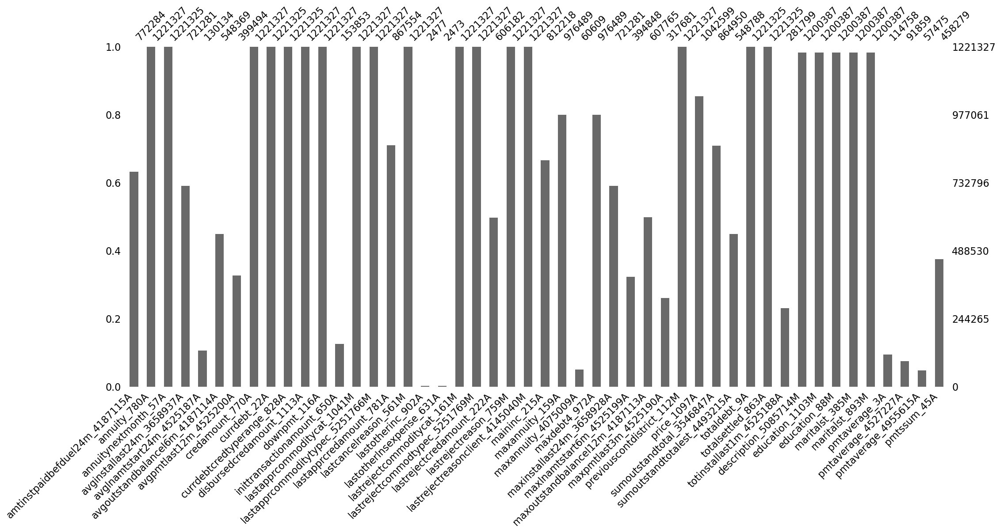

In [86]:
msno.bar(X_train)

In [87]:
# Select only numeric columns
numeric_cols = X_train.select_dtypes(include=['int64', 'float64'])

# Find the indices of the rows with negative values in any numeric column
negative_indices = numeric_cols[numeric_cols.lt(0).any(axis=1)].index

# Remove these rows from X_train
X_train = X_train.drop(negative_indices)

# Remove the corresponding rows from y_test and base_train
y_train = y_train.drop(negative_indices)
base_train = base_train.drop(negative_indices)

In [88]:
#remove that strange row with strange nan values
# Find the indices where 'description_5085714M' is NaN
nan_indices = X_train[X_train['description_5085714M'].isna()].index

# Drop these indices from the dataframes
X_train = X_train.drop(nan_indices)
y_train = y_train.drop(nan_indices)
base_train = base_train.drop(nan_indices)

In [89]:
# last but not least, fill in Na with -1 values
# Fill NaN values with -1 in the specified columns
for col in X_train.columns:
    if isinstance(X_test[col].dtype, pd.CategoricalDtype):
        X_train[col] = X_train[col].cat.add_categories([-1])
        X_train[col].fillna(-1, inplace=True)

X_train = X_train.fillna(-1)

X_train = X_train.fillna(-1)


<Axes: >

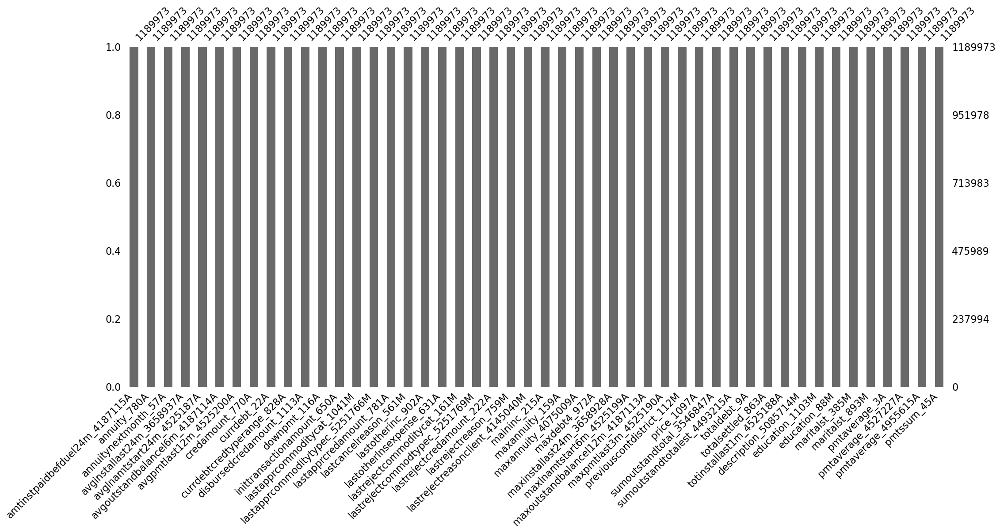

In [90]:
msno.bar(X_train)

## Data Cleaning - X_test

<Axes: >

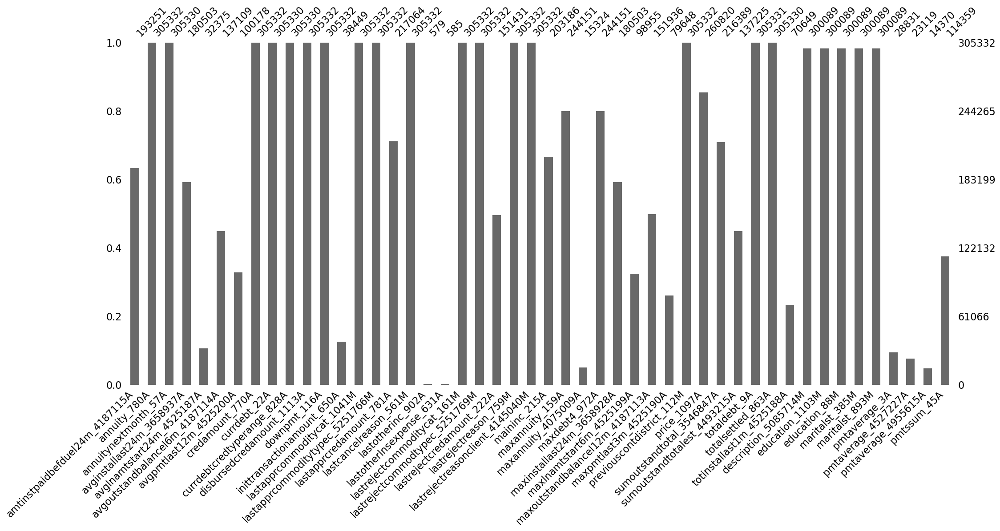

In [91]:
msno.bar(X_test)

In [92]:
#fill NaN values with -1 in the specified columns for datafraem X_test
"""
X_test['lastotherinc_902A'] = X_test['lastotherinc_902A'].fillna(-1) #Amount of other income reported by the client in their last application.
X_test['lastotherlnsexpense_631A'] = X_test['lastotherlnsexpense_631A'].fillna(-1) #Monthly expenses on other loans from the last application.
X_test['amtinstpaidbefduel24m_4187115A'] = X_test['amtinstpaidbefduel24m_4187115A'].fillna(-1) #Number of instalments paid before due date in the last 24 months.
X_test['avglnamtstart24m_4525187A'] = X_test['avglnamtstart24m_4525187A'].fillna(-1) #Average loan amount in the last 24 months.
X_test['avginstallast24m_3658937A'] = X_test['avginstallast24m_3658937A'].fillna(-1) #Average instalments paid by the client over the past 24 months.
X_test['avgoutstandbalancel6m_4187114A'] = X_test['avgoutstandbalancel6m_4187114A'].fillna(-1) #Average outstanding balance of applicant for the last 6 months.
X_test['avgpmtlast12m_4525200A'] = X_test['avgpmtlast12m_4525200A'].fillna(-1) #Average of payments made by the client in the last 12 months.
X_test['inittransactionamount_650A'] = X_test['inittransactionamount_650A'].fillna(-1) #Initial transaction amount of the credit application.
X_test['lastapprcredamount_781A'] = X_test['lastapprcredamount_781A'].fillna(-1) #Credit amount from the client's last application.
X_test['lastrejectcredamount_222A'] = X_test['lastrejectcredamount_222A'].fillna(-1) #Credit amount on last rejected application.
X_test['maininc_215A'] = X_test['maininc_215A'].fillna(-1) #Client's primary income amount.
X_test['maxannuity_159A'] = X_test['maxannuity_159A'].fillna(-1) #Maximum annuity previously obtained by client.
X_test['maxannuity_4075009A'] = X_test['maxannuity_4075009A'].fillna(-1) #Maximal annuity offered to the client in the current application.
X_test['maxdebt4_972A'] = X_test['maxdebt4_972A'].fillna(-1) #Maximal principal debt of the client in the history older than 4 months.
X_test['maxinstallast24m_3658928A'] = X_test['maxinstallast24m_3658928A'].fillna(-1) #Maximum instalment in the last 24 months.
X_test['maxlnamtstart6m_4525199A'] = X_test['maxlnamtstart6m_4525199A'].fillna(-1) #Maximum loan amount started in the last 6 months.
X_test['maxoutstandbalancel12m_4187113A'] = X_test['maxoutstandbalancel12m_4187113A'].fillna(-1) #Maximum outstanding balance in the last 12 months.
X_test['maxpmtlast3m_4525190A'] = X_test['maxpmtlast3m_4525190A'].fillna(-1) #Maximum payment made by the client in the last 3 months.
X_test['price_1097A'] = X_test['price_1097A'].fillna(-1) #Credit price.
X_test['sumoutstandtotal_3546847A'] = X_test['sumoutstandtotal_3546847A'].fillna(-1) #Sum of total outstanding amount.
X_test['sumoutstandtotalest_4493215A'] = X_test['sumoutstandtotalest_4493215A'].fillna(-1) #Sum of total outstanding amount.
X_test['totinstallast1m_4525188A'] = X_test['totinstallast1m_4525188A'].fillna(-1) #Total amount of monthly instalments paid in the previous month.
X_test['pmtaverage_3A'] = X_test['pmtaverage_3A'].fillna(-1) #Average of tax deductions.
X_test['pmtaverage_4527227A'] = X_test['pmtaverage_4527227A'].fillna(-1) #Average of tax deductions.
X_test['pmtaverage_4955615A'] = X_test['pmtaverage_4955615A'].fillna(-1) #Average of tax deductions.
X_test['pmtaverage_4955615A'] = X_test['pmtaverage_4955615A'].fillna(-1) #Average of tax deductions.
X_test['pmtssum_45A'] = X_test['pmtssum_45A'].fillna(-1) #Sum of tax deductions for the client.
"""


for col in X_test.columns:
    if isinstance(X_test[col].dtype, pd.CategoricalDtype):
        X_test[col] = X_test[col].cat.add_categories([-1])
        X_test[col].fillna(-1, inplace=True)

X_test = X_test.fillna(-1)



<Axes: >

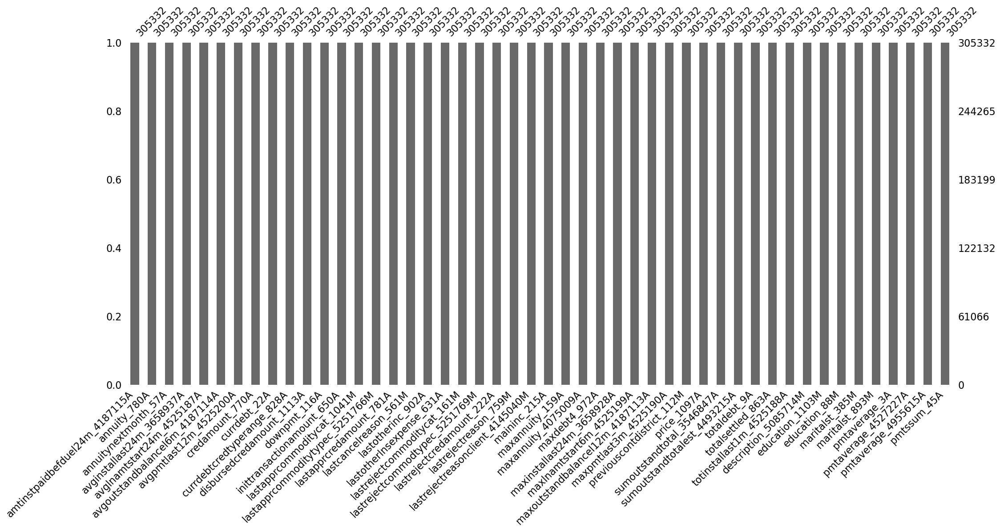

In [93]:
msno.bar(X_test)

In [94]:
# print out the shape of X_train, y_train, base_train,  X_test, y_test, base_test

print(X_train.shape, y_train.shape, base_train.shape, X_test.shape, y_test.shape, base_test.shape)

(1189973, 48) (1189973, 1) (1189973, 3) (305332, 48) (305332, 1) (305332, 3)


## Data Cleaning Done

### Scaling

In [95]:
# Calculate the min and max of each column
min_values = X_train.min()
max_values = X_train.max()

# Create a DataFrame from the min and max values
summary = pd.DataFrame({'Min': min_values, 'Max': max_values})

# Print the summary
print(summary)

                                          Min         Max
amtinstpaidbefduel24m_4187115A           -1.0   1408010.2
annuity_780A                             83.0    106007.0
annuitynextmonth_57A                     -1.0     87500.0
avginstallast24m_3658937A                -1.0    496148.8
avglnamtstart24m_4525187A                -1.0    513520.0
avgoutstandbalancel6m_4187114A           -1.0   1131135.9
avgpmtlast12m_4525200A                   -1.0    495910.4
credamount_770A                        2000.0    600000.0
currdebt_22A                             -1.0   1210629.1
currdebtcredtyperange_828A               -1.0   1029392.8
disbursedcredamount_1113A                 0.0    600000.0
downpmt_116A                              0.0    420400.0
inittransactionamount_650A               -1.0    200000.0
lastapprcommoditycat_1041M        P100_96_175    a55475b1
lastapprcommoditytypec_5251766M  P100_118_186    a55475b1
lastapprcredamount_781A                  -1.0    400000.0
lastcancelreas

In [96]:
#Scale

from sklearn.preprocessing import StandardScaler
import numpy as np

# Assume X_train is a pandas DataFrame
num_cols = X_train.select_dtypes(include=[np.number]).columns

# Create a scaler object
scaler = StandardScaler()

# Fit the scaler to the numerical columns of the training data and transform them
X_train[num_cols] = scaler.fit_transform(X_train[num_cols])

# Transform the numerical columns of the test data using the same scaler
X_test[num_cols] = scaler.transform(X_test[num_cols])


In [97]:
# Calculate the min and max of each column
min_values = X_train.min()
max_values = X_train.max()

# Create a DataFrame from the min and max values
summary = pd.DataFrame({'Min': min_values, 'Max': max_values})

# Print the summary
print(summary)

                                          Min         Max
amtinstpaidbefduel24m_4187115A      -0.568059   21.593137
annuity_780A                        -1.314739   33.917182
annuitynextmonth_57A                 -0.51378   30.474058
avginstallast24m_3658937A           -0.569814   88.021212
avglnamtstart24m_4525187A           -0.239794   24.973734
avgoutstandbalancel6m_4187114A      -0.435094   22.750096
avgpmtlast12m_4525200A              -0.350994   81.691919
credamount_770A                     -1.083664   12.481777
currdebt_22A                        -0.387879   23.173643
currdebtcredtyperange_828A          -0.298942   27.398914
disbursedcredamount_1113A           -1.085091   13.054106
downpmt_116A                        -0.134734  102.194139
inittransactionamount_650A          -0.257926   12.155351
lastapprcommoditycat_1041M        P100_96_175    a55475b1
lastapprcommoditytypec_5251766M  P100_118_186    a55475b1
lastapprcredamount_781A             -0.738321    10.51668
lastcancelreas

### Let's encoding for both X_train and X_test

In [98]:
from sklearn.preprocessing import OrdinalEncoder

# Specify the columns to be ordinal encoded
ordinal_cols = ['lastapprcommoditycat_1041M', 'lastapprcommoditytypec_5251766M', 'lastcancelreason_561M','lastrejectcommoditycat_161M','lastrejectcommodtypec_5251769M','lastrejectreason_759M','lastrejectreasonclient_4145040M','previouscontdistrict_112M','description_5085714M','education_1103M','education_88M','maritalst_385M','maritalst_893M']  # replace with your column names

# Create the ordinal encoder
encoder = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)

# Fit the encoder and transform X_train
X_train = X_train.copy()
X_train[ordinal_cols] = encoder.fit_transform(X_train[ordinal_cols])

# Transform X_test using the same encoder
X_test = X_test.copy()
X_test[ordinal_cols] = encoder.transform(X_test[ordinal_cols])

### Let's start downsampling

### downsampling

In [99]:
import pandas as pd
from sklearn.utils import resample

y_train_before = y_train.copy()

# Combine X_train and y_train
df = pd.concat([X_train, y_train], axis=1)

# Separate majority and minority classes
df_majority = df[df[y_train.columns[0]]==0]
df_minority = df[df[y_train.columns[0]]==1]

# Downsample majority class
df_majority_downsampled = resample(df_majority, 
                                 replace=False,    # sample without replacement
                                 n_samples=int((len(df_majority)/4)),     # to 1/4 of the original size
                                 random_state=123) # reproducible results

# Combine minority class with downsampled majority class
df_downsampled = pd.concat([df_majority_downsampled, df_minority])

# Separate X_train and y_train
X_train = df_downsampled.drop(y_train.columns[0], axis=1)
y_train = df_downsampled[y_train.columns[0]]

# Remove the corresponding rows in base_train
base_train = base_train.loc[X_train.index]

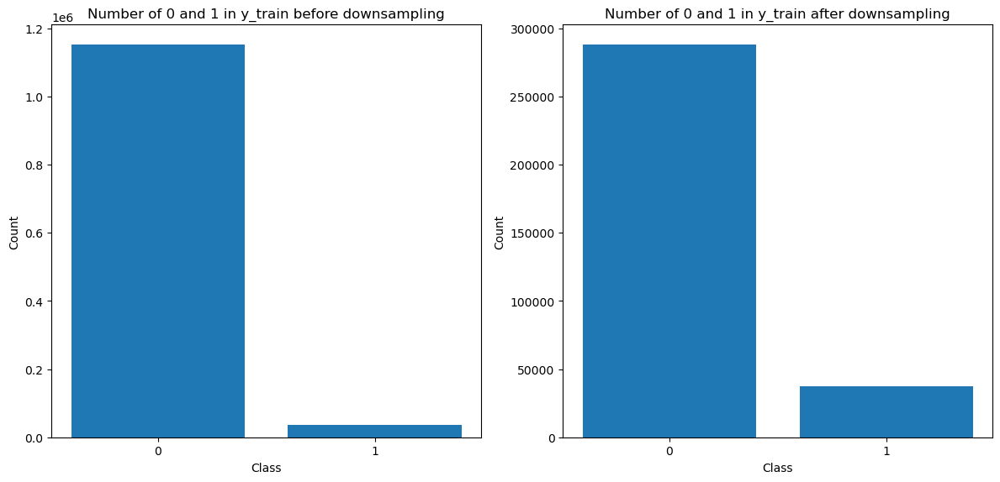

In [100]:
import matplotlib.pyplot as plt

# Assume y_train_before is y_train before downsampling
counts_before = y_train_before['target'].value_counts()

# y_train is after downsampling
counts_after = y_train.value_counts()

fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Plot before downsampling
axs[0].bar(counts_before.index, counts_before.values)
axs[0].set_xlabel('Class')
axs[0].set_ylabel('Count')
axs[0].set_title('Number of 0 and 1 in y_train before downsampling')
axs[0].set_xticks([0, 1])

# Plot after downsampling
axs[1].bar(counts_after.index, counts_after.values)
axs[1].set_xlabel('Class')
axs[1].set_ylabel('Count')
axs[1].set_title('Number of 0 and 1 in y_train after downsampling')
axs[1].set_xticks([0, 1])

# Show the plot
plt.tight_layout()
plt.show()

### SMOTE after downsampling

In [101]:
from imblearn.over_sampling import SMOTE

# Define SMOTE
smote = SMOTE(random_state=123)
# Assume y_train_before is y_train before downsampling
counts_before = y_train.value_counts()

# Fit and apply smote
X_train, y_train = smote.fit_resample(X_train, y_train)

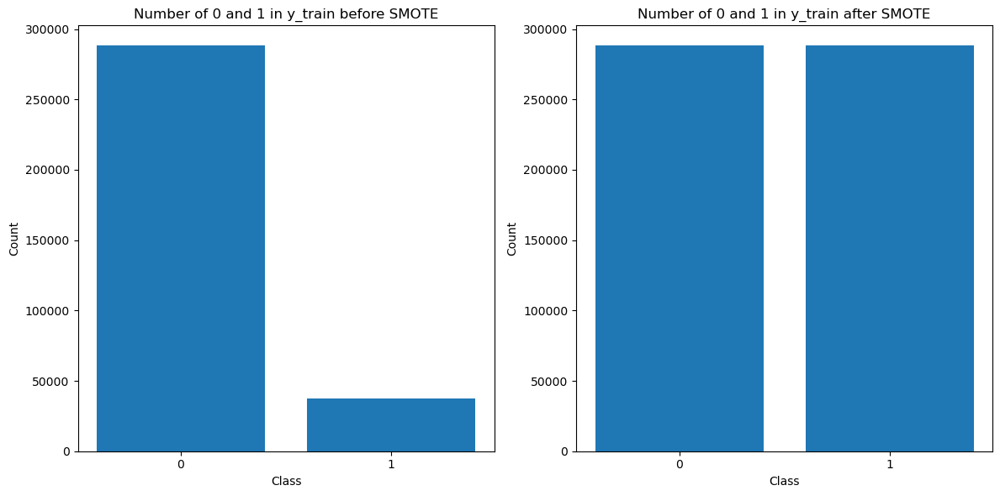

In [102]:
import matplotlib.pyplot as plt



# y_train is after downsampling
counts_after = y_train.value_counts()

fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Plot before downsampling
axs[0].bar(counts_before.index, counts_before.values)
axs[0].set_xlabel('Class')
axs[0].set_ylabel('Count')
axs[0].set_title('Number of 0 and 1 in y_train before SMOTE')
axs[0].set_xticks([0, 1])

# Plot after downsampling
axs[1].bar(counts_after.index, counts_after.values)
axs[1].set_xlabel('Class')
axs[1].set_ylabel('Count')
axs[1].set_title('Number of 0 and 1 in y_train after SMOTE')
axs[1].set_xticks([0, 1])

# Show the plot
plt.tight_layout()
plt.show()

## Let's train some model

In [108]:
#Subset of X_train and y_train to genterate plots
X_train = X_train[:10000]
y_train = y_train[:10000]


### Decision Tree

In [103]:
# print out the shape of X_train, y_train, base_train,  X_test, y_test, base_test

print(X_train.shape, y_train.shape, X_test.shape, y_test.shape, base_test.shape)

(576246, 48) (576246,) (305332, 48) (305332, 1) (305332, 3)


In [106]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report

# Initialize the Decision Tree model
decision_tree_model = DecisionTreeClassifier(random_state=0, class_weight='balanced')

# Fit the model on the training data
decision_tree_model.fit(X_train, y_train)

# Predict on the test data
y_pred_dt = decision_tree_model.predict(X_test)
y_score_dt = decision_tree_model.predict_proba(X_test)[:, 1]  # Select probabilities for the positive class


# Evaluate the model
accuracy_dt = accuracy_score(y_test, y_pred_dt)
print(f"Decision Tree Accuracy: {accuracy_dt}")
print("Decision Tree Classification Report:")
print(classification_report(y_test, y_pred_dt))

Decision Tree Accuracy: 0.8149096720946379
Decision Tree Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.83      0.90    295689
           1       0.05      0.27      0.09      9643

    accuracy                           0.81    305332
   macro avg       0.51      0.55      0.49    305332
weighted avg       0.94      0.81      0.87    305332



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


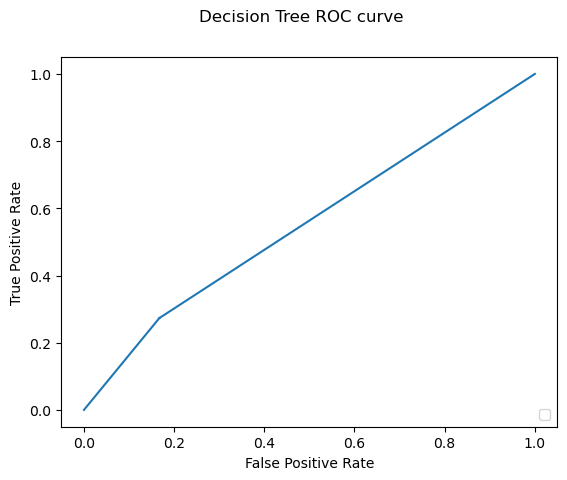

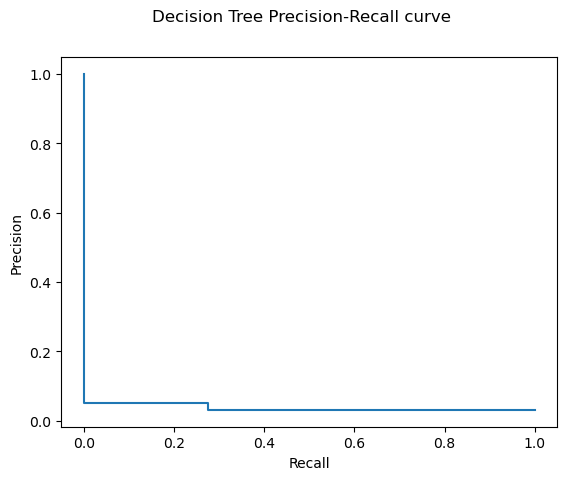

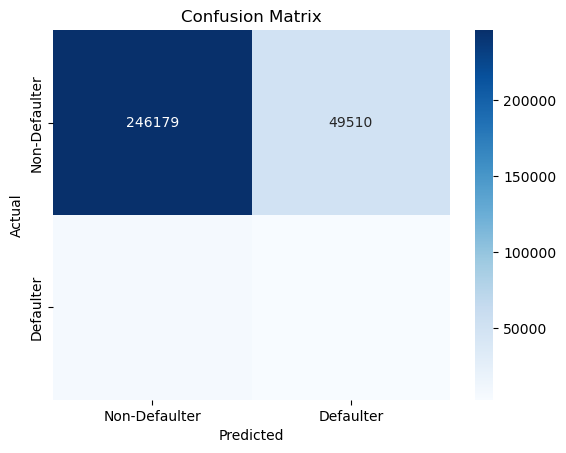

In [137]:
#ROC curve and precision recall curve, also the counfusion matrix

from sklearn.metrics import RocCurveDisplay, PrecisionRecallDisplay, roc_curve, precision_recall_curve, confusion_matrix, ConfusionMatrixDisplay

# Compute ROC curve and ROC area for each class
fpr_dt, tpr_dt, _ = roc_curve(y_test, y_score_dt)
roc_display = RocCurveDisplay(fpr=fpr_dt, tpr=tpr_dt).plot()

# Compute Precision-Recall curve and area for each class
precision_dt, recall_dt, _ = precision_recall_curve(y_test, y_score_dt)
pr_display = PrecisionRecallDisplay(precision=precision_dt, recall=recall_dt).plot()

# Compute confusion matrix and plot it

roc_display.figure_.suptitle("Decision Tree ROC curve")
pr_display.figure_.suptitle("Decision Tree Precision-Recall curve")

plt.show()

cm = confusion_matrix(y_test, y_pred_dt)


sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Non-Defaulter', 'Defaulter'], yticklabels=['Non-Defaulter', 'Defaulter'])
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix')
plt.show()



╒═════════════════════════════════╤══════════════╕
│ Feature                         │   Importance │
╞═════════════════════════════════╪══════════════╡
│ education_1103M                 │  0.135579    │
├─────────────────────────────────┼──────────────┤
│ lastrejectreasonclient_4145040M │  0.0959398   │
├─────────────────────────────────┼──────────────┤
│ pmtssum_45A                     │  0.0797315   │
├─────────────────────────────────┼──────────────┤
│ annuity_780A                    │  0.0697866   │
├─────────────────────────────────┼──────────────┤
│ price_1097A                     │  0.0652713   │
├─────────────────────────────────┼──────────────┤
│ maritalst_385M                  │  0.040243    │
├─────────────────────────────────┼──────────────┤
│ credamount_770A                 │  0.0382882   │
├─────────────────────────────────┼──────────────┤
│ amtinstpaidbefduel24m_4187115A  │  0.0317696   │
├─────────────────────────────────┼──────────────┤
│ disbursedcredamount_1113A    

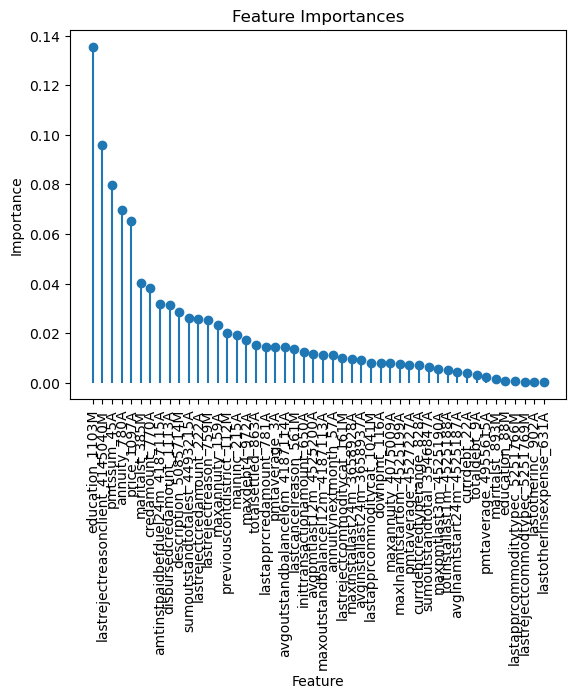

In [144]:
from tabulate import tabulate
# Import the tabulate library
# Extract feature importances
importances = decision_tree_model.feature_importances_

# Get feature names (assuming you have a list of feature names)
feature_names = X_train.columns

# Combine feature names and their importance scores
feature_importances = zip(feature_names, importances)

# Sort the features by importance
sorted_feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)

# Format the feature importances into a table
table = tabulate(sorted_feature_importances, headers=["Feature", "Importance"], tablefmt="fancy_grid")

# Print the table
print(table)

# Create a stem plot
plt.stem(sorted_feature_names, sorted_importances, basefmt=' ')

# Rotate the x-axis labels for better visibility
plt.xticks(rotation=90)

# Set the axis labels and title
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.title('Feature Importances')

# Display the plot
plt.show()




In [151]:
import lime
import lime.lime_tabular

# Create a Lime explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, 
                                                   feature_names=X_train.columns, 
                                                   class_names=['0', '1'], 
                                                   verbose=True, 
                                                   mode='classification')

# Choose multiple test instances to explain
for i in range(5):
    test_instance = X_test.iloc[i]

    # Explain the prediction
    exp = explainer.explain_instance(test_instance.values, decision_tree_model.predict_proba, num_features=5)

    # Show the explanation
    print(f"Explanation for instance {i+1}:")
    exp.show_in_notebook(show_table=True)

/Users/ronaldleung/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


Intercept 1.0130218390330534
Prediction_local [0.79004213]
Right: 0.0
Explanation for instance 1:


/Users/ronaldleung/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


Intercept 1.0074075703933782
Prediction_local [0.78873823]
Right: 0.0
Explanation for instance 2:


/Users/ronaldleung/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


Intercept 0.9858724972551003
Prediction_local [0.76412303]
Right: 0.0
Explanation for instance 3:


/Users/ronaldleung/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


Intercept 1.0126639622286924
Prediction_local [0.79735956]
Right: 0.0
Explanation for instance 4:


/Users/ronaldleung/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


Intercept 1.0061426500038118
Prediction_local [0.79803773]
Right: 0.0
Explanation for instance 5:


In [119]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.metrics import classification_report

# Define the parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10]
}

# Create a base model
rf = RandomForestClassifier(random_state=42)

# Instantiate the grid search model
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid,
                           cv=KFold(n_splits=5), verbose=2)

# Create a subset of the data
#X_subset = X_train[:10000]
#y_subset = y_train[:10000]

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Get the best parameters
best_params = grid_search.best_params_
print(best_params)

# Get the best estimator
best_estimator = grid_search.best_estimator_

# Predict on the test data
y_pred = best_estimator.predict(X_test)

# Evaluate the model
print('Test Accuracy:', accuracy_score(y_test, y_pred))

# Print classification report
print(classification_report(y_test, y_pred))

Fitting 5 folds for each of 27 candidates, totalling 135 fits
[CV] END max_depth=None, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END max_depth=None, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END max_depth=None, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END max_depth=None, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END max_depth=None, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END max_depth=None, min_samples_split=2, n_estimators=200; total time=   0.1s
[CV] END max_depth=None, min_samples_split=2, n_estimators=200; total time=   0.1s
[CV] END max_depth=None, min_samples_split=2, n_estimators=200; total time=   0.1s
[CV] END max_depth=None, min_samples_split=2, n_estimators=200; total time=   0.1s
[CV] END max_depth=None, min_samples_split=2, n_estimators=200; total time=   0.1s
[CV] END max_depth=None, min_samples_split=2, n_estimators=300; total time=   0.1s
[CV] END max_depth=None, 

/Users/ronaldleung/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/ronaldleung/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/ronaldleung/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


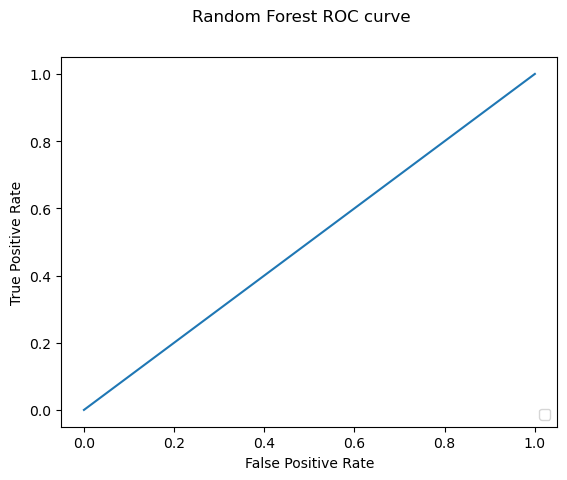

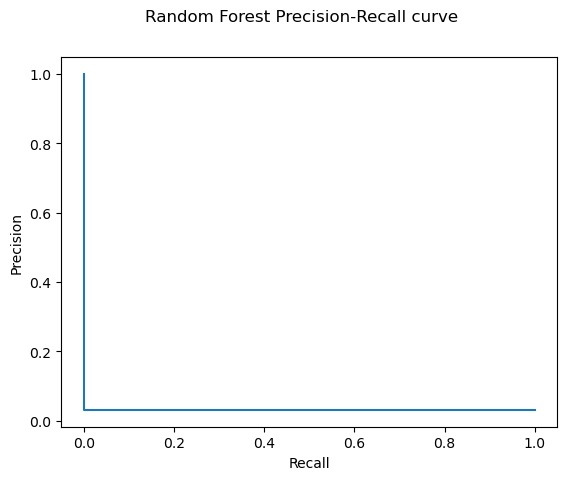

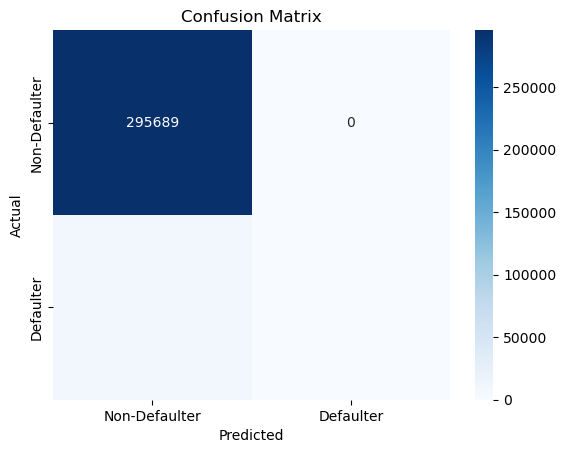

In [136]:
#ROC curve and precision recall curve, also the confusion matrix

from sklearn.metrics import RocCurveDisplay, PrecisionRecallDisplay, confusion_matrix, ConfusionMatrixDisplay

# Predict probabilities on the test data using the best estimator from grid search
y_score = best_estimator.predict_proba(X_test)  # Select probabilities for the positive class

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, y_score)
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot()

# Compute Precision-Recall curve and area for each class
precision, recall, _ = precision_recall_curve(y_test, y_score)
pr_display = PrecisionRecallDisplay(precision=precision, recall=recall).plot()

# Predict on the test data using the best estimator from grid search
y_pred = best_estimator.predict(X_test)

# Compute confusion matrix and plot it



roc_display.figure_.suptitle("Random Forest ROC curve")
pr_display.figure_.suptitle("Random Forest Precision-Recall curve")

plt.show()


cm = confusion_matrix(y_test, y_pred)

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Non-Defaulter', 'Defaulter'], yticklabels=['Non-Defaulter', 'Defaulter'])
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix')
plt.show()



### KNN

In [117]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report

# Initialize the kNN Classifier model
# 'n_neighbors' is set to 5 as a starting point
knn_model = KNeighborsClassifier(n_neighbors=5)

# Fit the model on the training data
knn_model.fit(X_train, y_train)

# Predict on the test data
y_pred_knn = knn_model.predict(X_test.values)

# Evaluate the model
accuracy_knn = accuracy_score(y_test, y_pred_knn)
print(f"kNN Classifier Accuracy: {accuracy_knn}")
print("kNN Classifier Classification Report:")
print(classification_report(y_test, y_pred_knn))


/Users/ronaldleung/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


kNN Classifier Accuracy: 0.9684179843580103
kNN Classifier Classification Report:
              precision    recall  f1-score   support

           0       0.97      1.00      0.98    295689
           1       0.00      0.00      0.00      9643

    accuracy                           0.97    305332
   macro avg       0.48      0.50      0.49    305332
weighted avg       0.94      0.97      0.95    305332



/Users/ronaldleung/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/ronaldleung/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/ronaldleung/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


/Users/ronaldleung/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/Users/ronaldleung/anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


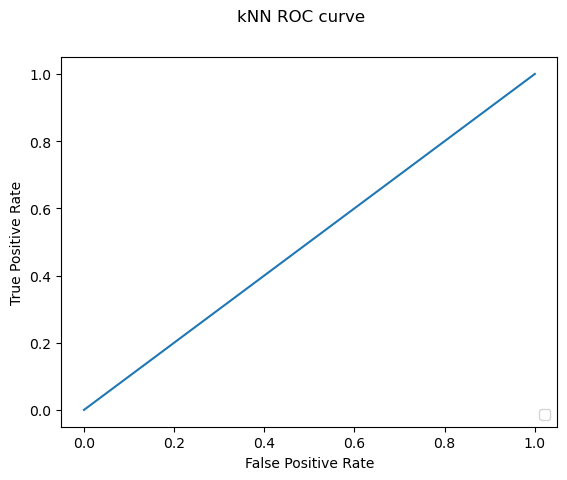

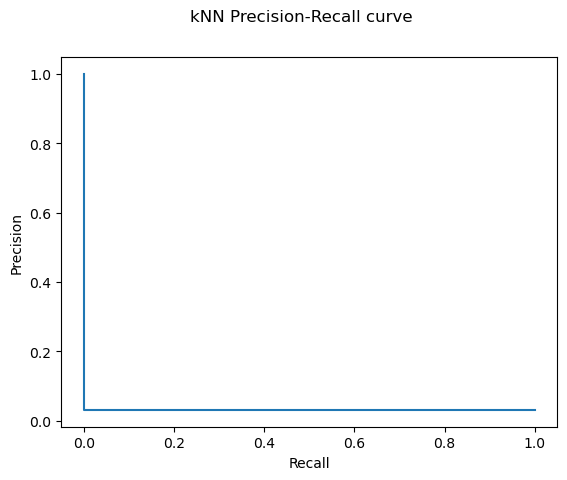

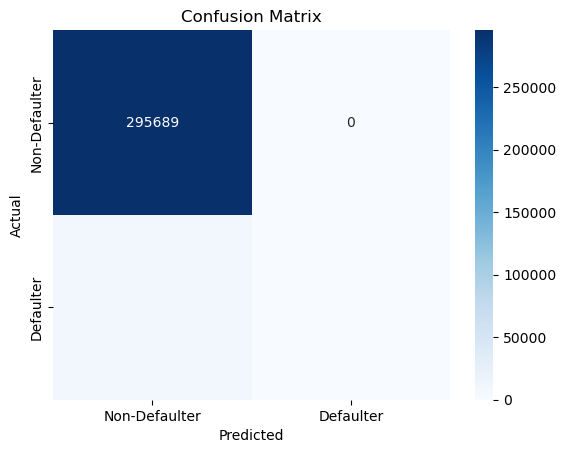

In [135]:
#ROC curve and precision recall curve, also the confusion matrix

from sklearn.metrics import RocCurveDisplay, PrecisionRecallDisplay, confusion_matrix, ConfusionMatrixDisplay

# Predict probabilities on the test data using the knn_model
y_score_knn = knn_model.predict_proba(X_test.values) # Select probabilities for the positive class

# Compute ROC curve and ROC area for each class
fpr_knn, tpr_knn, _ = roc_curve(y_test, y_score_knn)
roc_display = RocCurveDisplay(fpr=fpr_knn, tpr=tpr_knn).plot()

# Compute Precision-Recall curve and area for each class
precision_knn, recall_knn, _ = precision_recall_curve(y_test, y_score_knn)
pr_display = PrecisionRecallDisplay(precision=precision_knn, recall=recall_knn).plot()

# Predict on the test data using the knn_model
y_pred_knn = knn_model.predict(X_test.values)

# Compute confusion matrix and plot it



roc_display.figure_.suptitle("kNN ROC curve")
pr_display.figure_.suptitle("kNN Precision-Recall curve")

plt.show()
cm_knn = confusion_matrix(y_test, y_pred_knn)
plt.show()

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Non-Defaulter', 'Defaulter'], yticklabels=['Non-Defaulter', 'Defaulter'])
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix')
plt.show()

### Neural Network

In [125]:
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report, accuracy_score

mlp = MLPClassifier(hidden_layer_sizes=(30, 30, 30),  # Example: one hidden layer with 100 neurons
                    activation='relu',  # Activation function for the hidden layer
                    solver='adam',  # Solver for weight optimization
                    max_iter=500,  # Maximum number of epochs
                    random_state=1,  # Seed for random number generator for reproducibility
                    learning_rate_init=0.001,
                    tol=0.000001,
                    verbose=True,
                    batch_size='auto',  # 'auto' means the batch size is min(200, n_samples)
                    ) 


mlp.fit(X_train, y_train)

y_pred = mlp.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy*100:.2f}%')

# Detailed classification report
print(classification_report(y_test, y_pred))

Iteration 1, loss = 35.23816129
Iteration 2, loss = 26.08036838
Iteration 3, loss = 15.09951477
Iteration 4, loss = 6.92916043
Iteration 5, loss = 2.62279369
Iteration 6, loss = 0.33558254
Iteration 7, loss = 0.01290317
Iteration 8, loss = 0.00548068
Iteration 9, loss = 0.00119317
Iteration 10, loss = 0.00045667
Iteration 11, loss = 0.00015316
Iteration 12, loss = 0.00008224
Iteration 13, loss = 0.00007004
Iteration 14, loss = 0.00005759
Iteration 15, loss = 0.00005421
Iteration 16, loss = 0.00005120
Iteration 17, loss = 0.00004890
Iteration 18, loss = 0.00004772
Iteration 19, loss = 0.00004659
Iteration 20, loss = 0.00004606
Iteration 21, loss = 0.00004534
Iteration 22, loss = 0.00004491
Iteration 23, loss = 0.00004403
Iteration 24, loss = 0.00004159
Iteration 25, loss = 0.00004013
Iteration 26, loss = 0.00003621
Iteration 27, loss = 0.00003386
Iteration 28, loss = 0.00003204
Iteration 29, loss = 0.00003074
Iteration 30, loss = 0.00002876
Iteration 31, loss = 0.00002775
Iteration 32, 

/Users/ronaldleung/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/ronaldleung/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.97      1.00      0.98    295689
           1       0.00      0.00      0.00      9643

    accuracy                           0.97    305332
   macro avg       0.48      0.50      0.49    305332
weighted avg       0.94      0.97      0.95    305332



/Users/ronaldleung/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


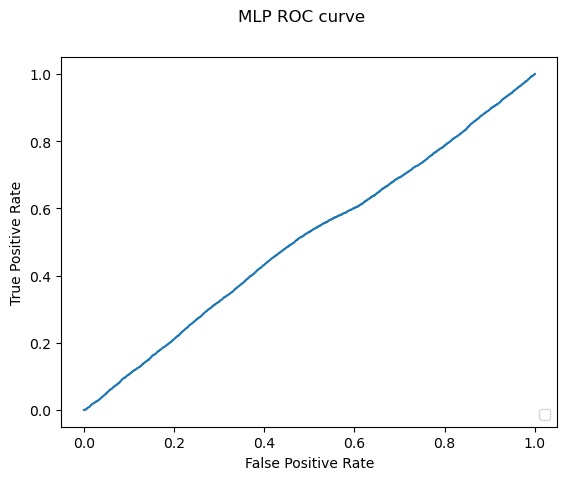

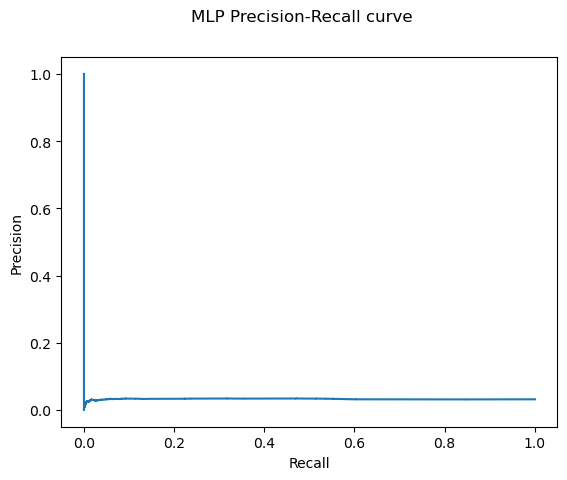

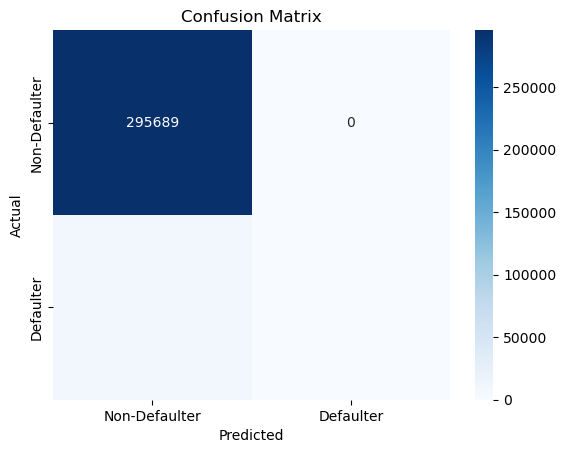

In [134]:
#ROC curve and precision recall curve, also the confusion matrix

from sklearn.metrics import RocCurveDisplay, PrecisionRecallDisplay, confusion_matrix, ConfusionMatrixDisplay

# Predict probabilities on the test data using the mlp model
y_score_mlp = mlp.predict_proba(X_test)[:, 1]  # Select probabilities for the positive class

# Compute ROC curve and ROC area for each class
fpr_mlp, tpr_mlp, _ = roc_curve(y_test, y_score_mlp)
roc_display = RocCurveDisplay(fpr=fpr_mlp, tpr=tpr_mlp).plot()

# Compute Precision-Recall curve and area for each class
precision_mlp, recall_mlp, _ = precision_recall_curve(y_test, y_score_mlp)
pr_display = PrecisionRecallDisplay(precision=precision_mlp, recall=recall_mlp).plot()

# Predict on the test data using the mlp model
y_pred_mlp = mlp.predict(X_test)

# Compute confusion matrix and plot it


roc_display.figure_.suptitle("MLP ROC curve")
pr_display.figure_.suptitle("MLP Precision-Recall curve")

cm_mlp = confusion_matrix(y_test, y_pred_mlp)
plt.show()

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Non-Defaulter', 'Defaulter'], yticklabels=['Non-Defaulter', 'Defaulter'])
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix')
plt.show()
